ANONYMIZED

This notebook assumes familiarity with the ANONYMIZED.

In [1]:
try:
    import ANONYMIZED
except ImportError:
    commit = ""
    get_ipython().run_line_magic(
        magic_name="pip",
        line=(
            "install -U"
            f" git+ANONYMIZED"
        ),
    )

from ANONYMIZED.utils import setup

setup()  # create directory structure

from ANONYMIZED.imports import *
from ANONYMIZED import visualization, patch_utils, maze, vfield

AX_SIZE = 5.5

Already downloaded https://nerdsniper.net/mats/model_rand_region_5.pth


# Generating top-right vectors
We're going to generate a new kind of behavior-modifying activation-space vector. This vector will be a top-right vector. We compute it by diffing activations across two environments: one where the top-right corner is considerably higher up, and the original one.

In [2]:
@interact
def top_right_maze_pairs(seed=IntSlider(value=0, min=0, max=100)):
    venv = maze.get_top_right_venv_pair(seed=seed)
    fig, axs = plt.subplots(1, 2, figsize=(AX_SIZE, AX_SIZE * 2))
    for idx in (0, 1):
        visualization.visualize_venv(
            venv=venv,
            idx=idx,
            ax=axs[idx],
            ax_size=AX_SIZE,
            render_padding=True,
        )

    # Title each axis
    axs[0].set_title("Path to top-right")
    axs[1].set_title("Original maze")

    plt.show()

interactive(children=(IntSlider(value=0, description='seed'), Output()), _dom_classes=('widget-interact',))

ANONYMIZED noticed that when the top-right-most reachable square is closer to the absolute
top-right, the agent seems to have an increased tendency to go to there.
The next interactive shows this effect.

(Arrow thickness is a technical artifact here. Just look at arrow directions.)

In [3]:
@interact
def top_right_vf_pairs(seed=IntSlider(value=0, min=0, max=100)):
    venv = maze.get_top_right_venv_pair(seed=seed)
    fig, axs = plt.subplots(1, 2, figsize=(AX_SIZE, AX_SIZE * 2))
    for idx in (0, 1):
        vfield = visualization.vector_field(venv, policy, idx=idx)
        visualization.plot_vf(vfield, ax=axs[idx], render_padding=True)

    # Title each axis
    axs[0].set_title("Path to top-right")
    axs[1].set_title("Original maze")

    plt.show()

interactive(children=(IntSlider(value=0, description='seed'), Output()), _dom_classes=('widget-interact',))

As in the cheese vector case, we get a "top right vector" by:
1. Running a forward pass on the "path to top-right" maze, and another
   forward pass on the original maze, and storing the activations for
   each. In both situations, the mouse is located at the starting square.
2. About halfway through the network (at the second Impala block's
   first residual add), take the difference in channel activation tensors to be
   the "top right vector."

We then add `coeff*top_right_vector` to halfway through future forward
passes, where the input observations differ due to different mouse
locations.

# The effect of adding the top-right vector
The top-right vector is highly effective at increasing the probability
the agent goes to the top-right corner. 

In [4]:
def title_fig(
    fig: plt.Figure, coeff: float, seed: int, source_seed: Optional[int] = None
):
    """Add a title to a figure, describing the patch appropriately."""
    descriptor = "added" if coeff >= 0 else "subtracted"
    seed_str = "{:,}".format(seed)
    displ_coeff = np.abs(coeff)
    fig.suptitle(
        (
            f"Seed {seed_str}. Top-right vector"
            f" {'from source seed ' + str(source_seed) + ' ' if source_seed is not None else ''}{descriptor} with"
            f" coefficient {displ_coeff:.1f}"
        ),
        fontsize=20,
        y=0.94,
    )


@interact
def examine_tr_patch(
    seed=IntSlider(min=0, max=100, step=1, value=0),
    coeff=FloatSlider(min=-5, max=5, step=0.1, value=1),
):
    venv_pair = maze.get_top_right_venv_pair(seed=seed)
    patch = patch_utils.patch_from_venv_pair(
        venv_pair, layer_name=default_layer, hook=hook, coeff=coeff
    )

    # Show the effect of the patch
    target_venv = maze.create_venv(num=1, start_level=seed, num_levels=1)
    fig, axs, info = patch_utils.compare_patched_vfields(
        target_venv,
        patch,
        hook,
        render_padding=False,
        ax_size=AX_SIZE,
        show_components=False,
    )

    title_fig(fig, coeff, seed)
    plt.show(fig)

interactive(children=(IntSlider(value=0, description='seed'), FloatSlider(value=1.0, description='coeff', max=…

For example, in maze seed 0, the original trained network doesn't go to the
top-right corner:
![](https://res.cloudinary.com/lesswrong-2-0/image/upload/f_auto,q_auto/v1/mirroredImages/cAC4AXiNC5ig6jQnc/o24edwffjw5id3xexkjp)

Adding the top-right vector fixes this issue:

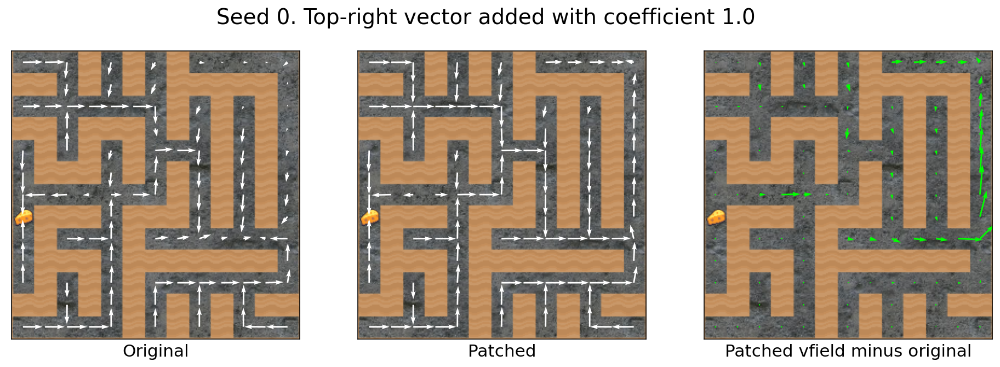

In [5]:
examine_tr_patch(coeff=1.0, seed=0)

Likewise for seeds 2 and 22:

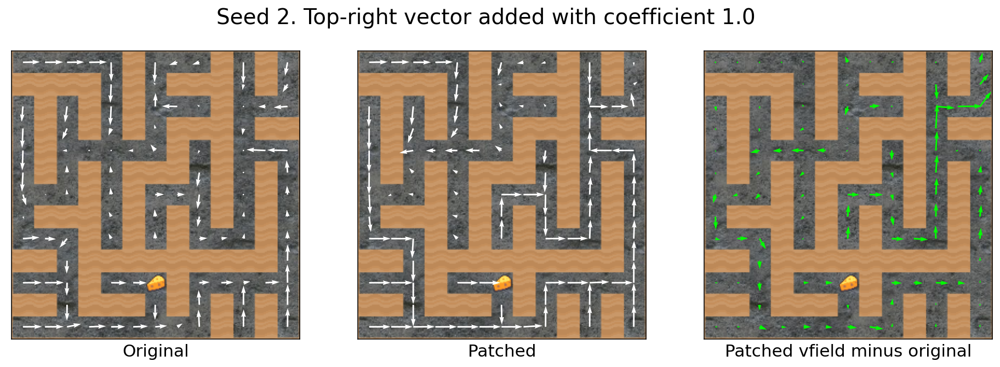

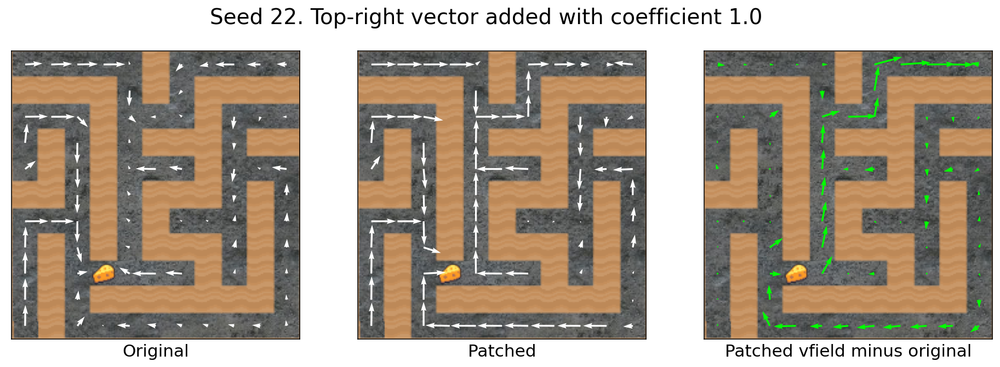

In [6]:
examine_tr_patch(coeff=1.0, seed=2)
examine_tr_patch(coeff=1.0, seed=22)

Small mazes (like seed 1) seem far less affected by the top-right vector. 

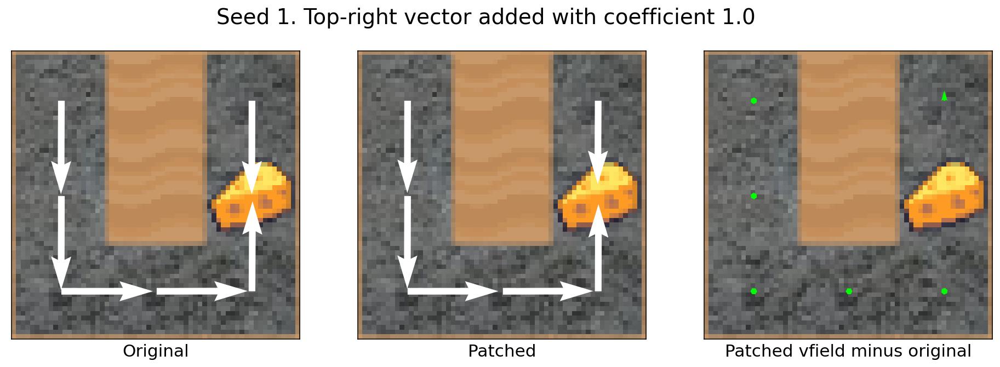

In [7]:
examine_tr_patch(coeff=1.0, seed=1)

There are some exceptions, like seed 43,609, but they are uncommon.

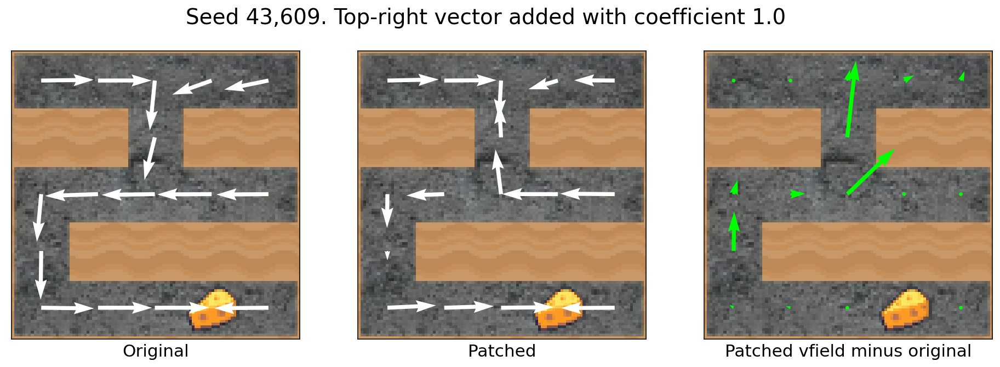

In [8]:
examine_tr_patch(coeff=1.0, seed=43609)

You can look for yourself, without cherry-picking. The following
function generates small mazes. Click the "generate new maze" button to
get another random seed. 

In [9]:
fig_out = widgets.Output()


def show_small_maze(max_size: int = 6):
    """Show the top-right vector diff for a randomly generated maze of
    size less than or equal to max_size."""
    # Generate the seed and the top-right patch
    seed = maze.rand_seed_with_size(max_size=max_size)
    venv_pair = maze.get_top_right_venv_pair(seed=seed)
    patch = patch_utils.patch_from_venv_pair(
        venv_pair, layer_name=default_layer, hook=hook, coeff=1
    )

    # Show the effect of the patch
    venv = maze.create_venv(num=1, start_level=seed, num_levels=1)
    fig, axs, info = patch_utils.compare_patched_vfields(
        venv,
        patch,
        hook,
        render_padding=False,
        ax_size=AX_SIZE,
        show_components=False,
    )
    title_fig(fig, 1, seed)

    fig_out.clear_output(wait=True)
    with fig_out:
        plt.show(fig)

In [10]:
display(fig_out)
show_small_maze()

button = widgets.Button(description="Generate new maze")
button.on_click(lambda _: show_small_maze(max_size=6))
display(button)

Output()

Button(description='Generate new maze', style=ButtonStyle())

The agent also tends to be less [retargetable](https://www.lesswrong.com/posts/cAC4AXiNC5ig6jQnc/understanding-and-controlling-a-maze-solving-net#Retargeting_the_agent_to_maze_locations) in smaller mazes.
We don't know why.

## Adding the top-right vector with different strengths
Varying the `coefficient` will vary the effect. However, very large
coefficients will screw up cognition.

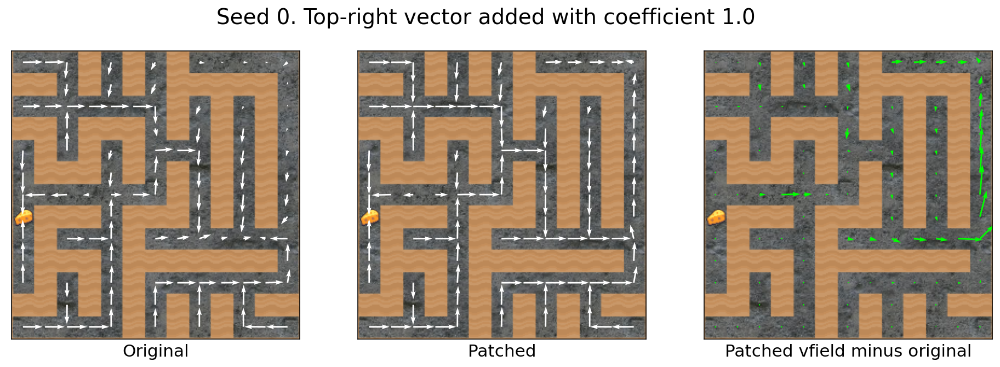

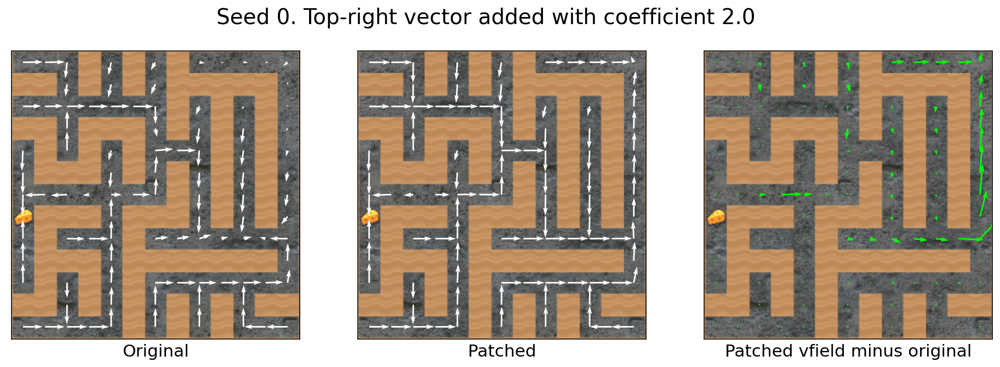

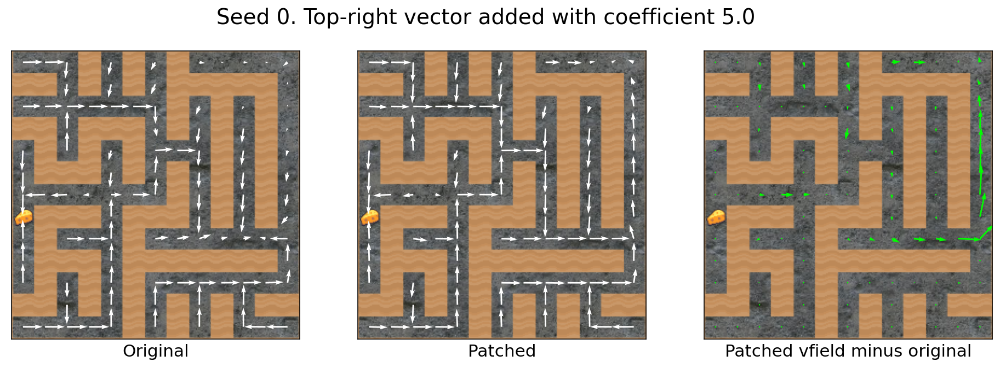

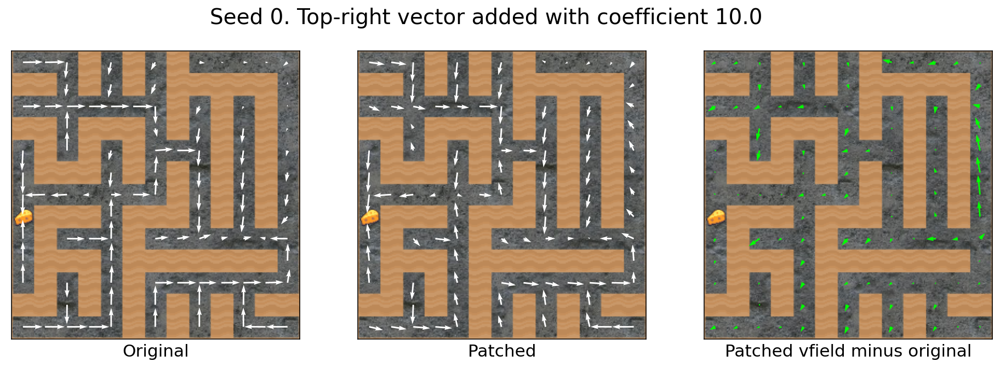

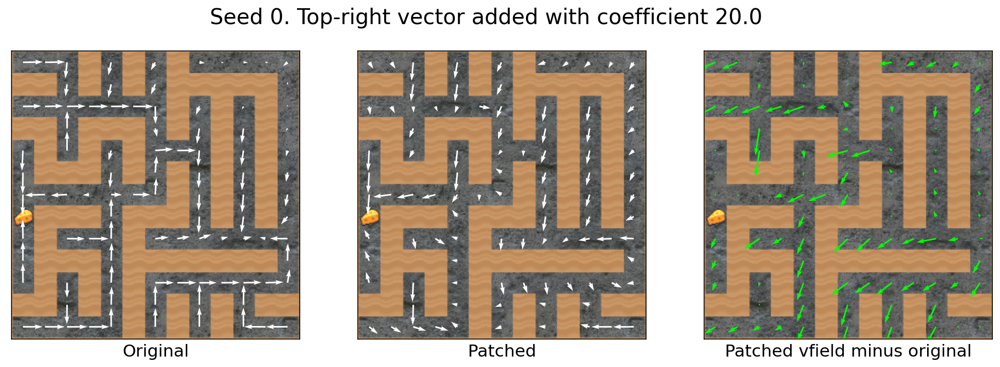

In [11]:
examine_tr_patch(coeff=1.0, seed=0)
examine_tr_patch(coeff=2.0, seed=0)
examine_tr_patch(coeff=5.0, seed=0)
examine_tr_patch(coeff=10.0, seed=0)
examine_tr_patch(coeff=20.0, seed=0)

## Subtracting the top-right vector has little effect

For some reason, subtracting the top-right vector has very little
effect. (Similarly, _adding_ the cheese vector had little effect.)

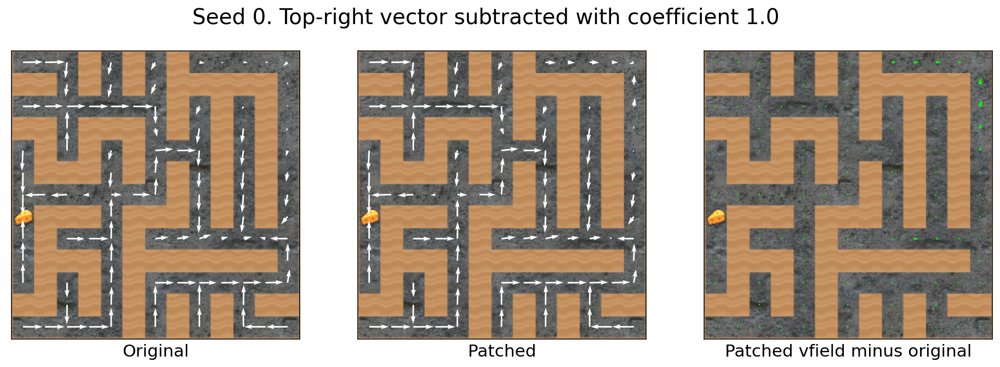

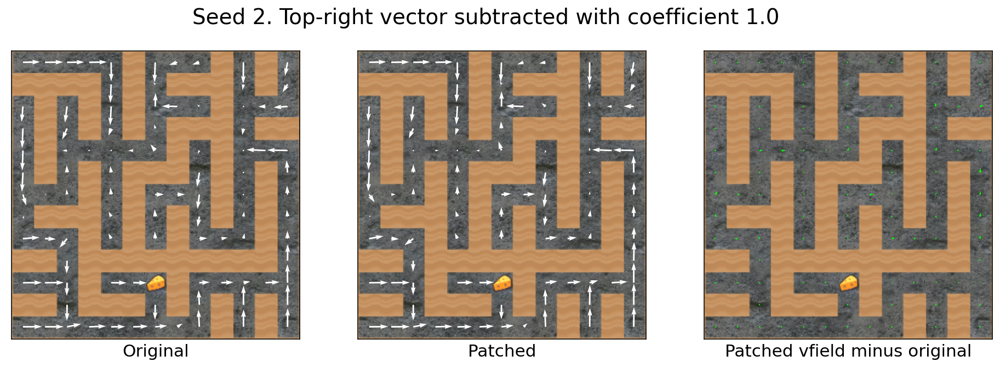

In [12]:
examine_tr_patch(coeff=-1.0, seed=0)
examine_tr_patch(coeff=-1.0, seed=2)

However, subtracting with coefficients around 3.0 does seem to make the
policy go to the top-right, albeit more weakly than adding with
coefficient 5.0.

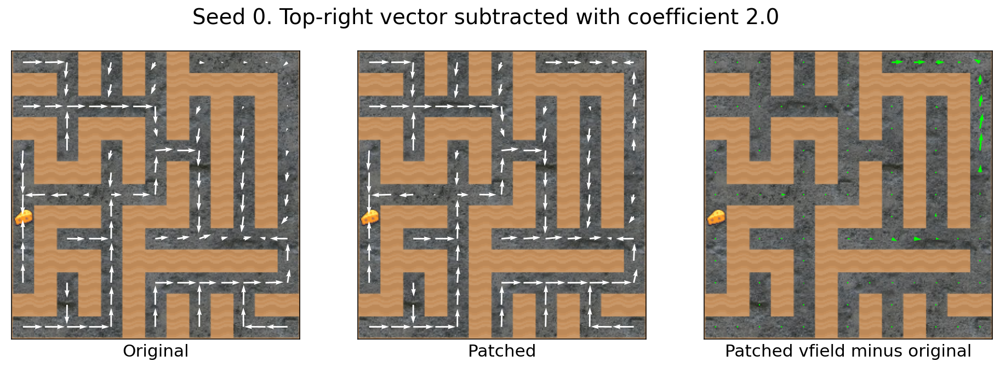

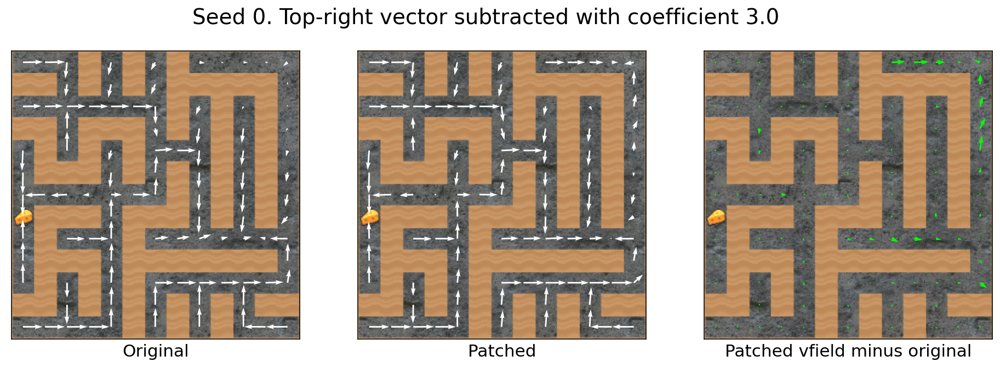

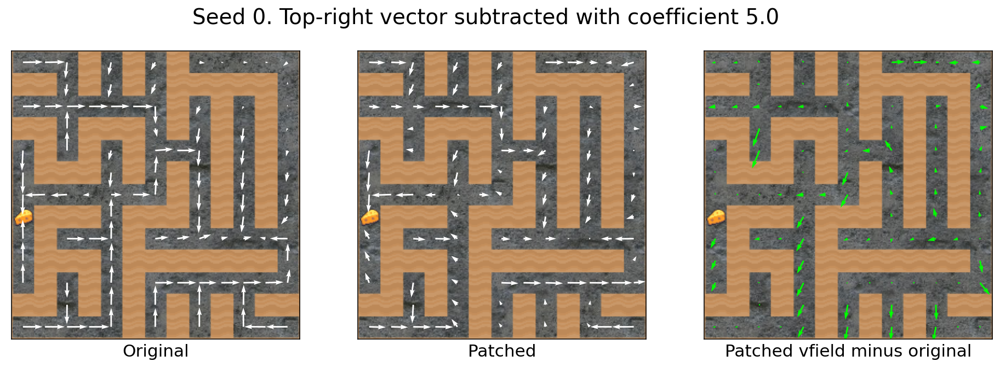

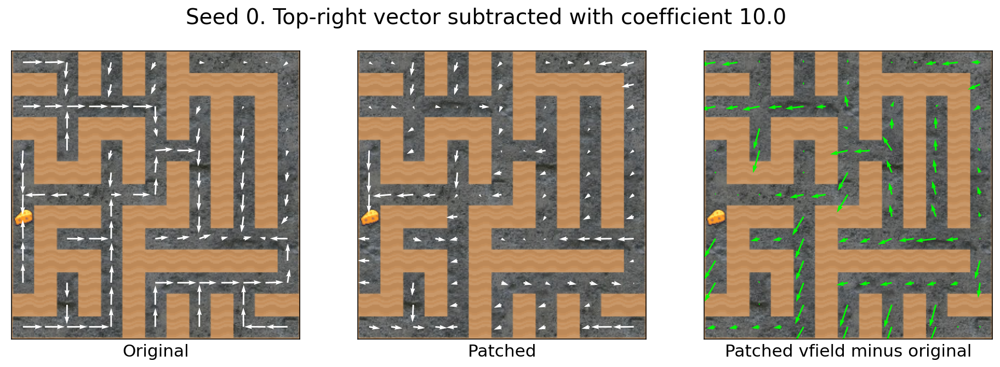

In [23]:
examine_tr_patch(coeff=-2.0, seed=0)
examine_tr_patch(coeff=-3.0, seed=0)
examine_tr_patch(coeff=-5.0, seed=0)
examine_tr_patch(coeff=-10.0, seed=0)

Results on seed 2 are more mixed.

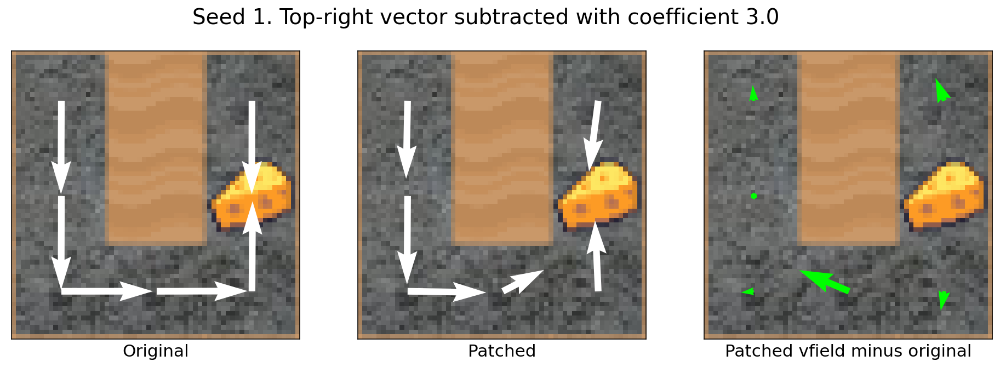

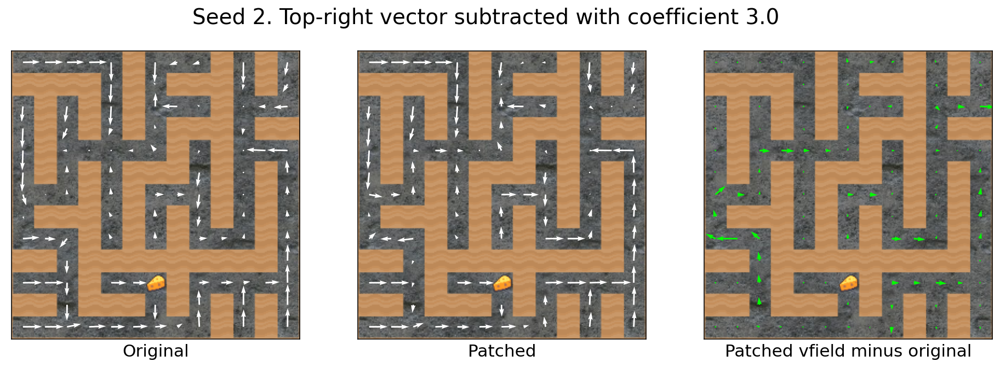

In [24]:
examine_tr_patch(coeff=-3.0, seed=2)

# Transfering the top-right vector across mazes
Often the transfer will work well. However, the top-right vectors for
small mazes often cause strange behavior.

In [13]:
@interact
def examine_tr_patch_transfer(
    source_seed=IntSlider(min=0, max=100, step=1, value=0),
    target_seed=IntSlider(min=0, max=100, step=1, value=2),
    coeff=FloatSlider(min=-5, max=5, step=0.1, value=1),
):
    """Given a top-right patch from a source maze, show the effect of
    using that patch on a target seed.

    Arguments:
        source_seed: The seed of the maze from which the patch was
            generated.
        target_seed: The seed of the maze on which the patch will be
            applied.
        coeff: The coefficient of the patch.
    """
    venv_pair = maze.get_top_right_venv_pair(seed=source_seed)
    patch = patch_utils.patch_from_venv_pair(
        venv_pair, layer_name=default_layer, hook=hook, coeff=coeff
    )

    # Show the effect of the patch
    target_venv = maze.create_venv(
        num=1, start_level=target_seed, num_levels=1
    )
    fig, axs, info = patch_utils.compare_patched_vfields(
        target_venv,
        patch,
        hook,
        render_padding=False,
        ax_size=AX_SIZE,
        show_components=False,
    )
    title_fig(fig=fig, coeff=coeff, seed=target_seed, source_seed=source_seed)

    plt.show(fig)

interactive(children=(IntSlider(value=0, description='source_seed'), IntSlider(value=2, description='target_se…

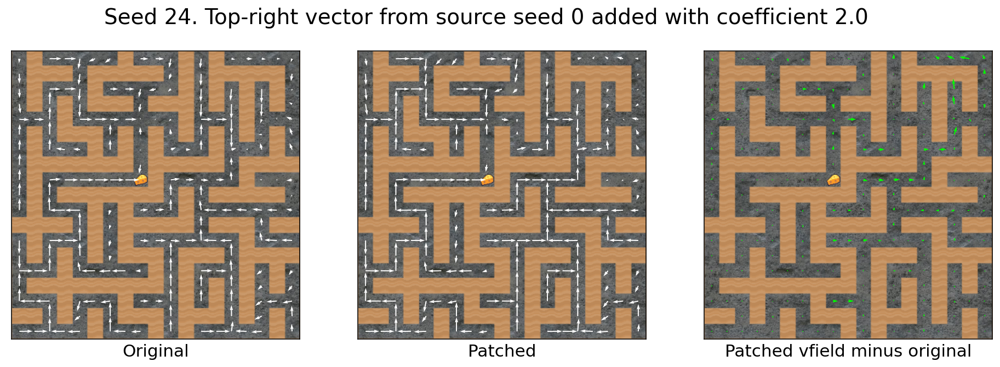

In [14]:
examine_tr_patch_transfer(coeff=2.0, source_seed=0, target_seed=24)

For the `seed 0 -> seed 28` transfer, the patched agent doesn't _quite_
go to the top-right corner. Instead, there seems to be a "go up and then
right" drive. 

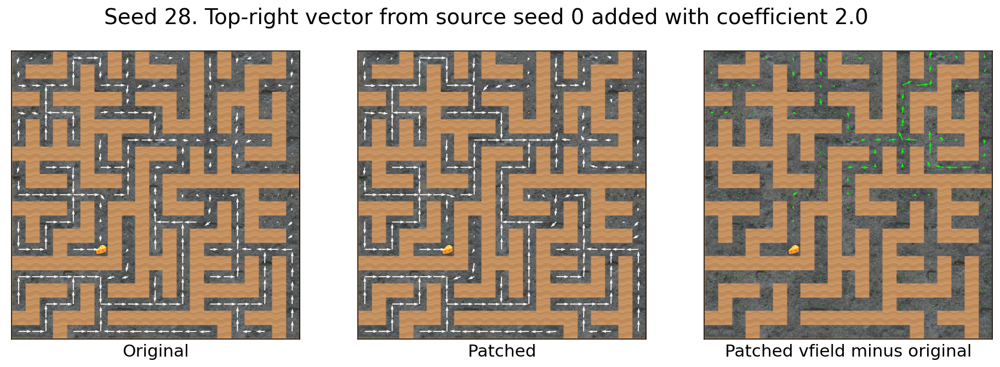

In [15]:
examine_tr_patch_transfer(coeff=2.0, source_seed=0, target_seed=28)

Perhaps "go up and then right" is due to the way we generated seed 0's
top-right vector: 

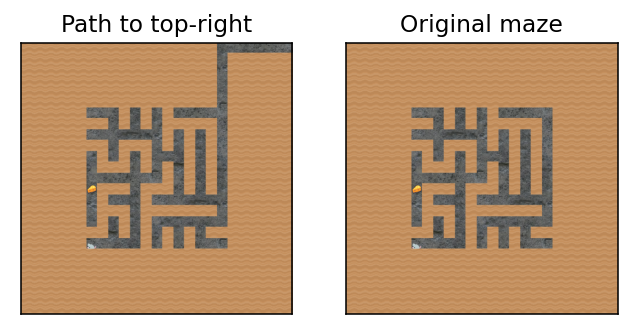

In [16]:
top_right_maze_pairs(seed=0)

Top-right vectors from small mazes can cause strange pathing in larger
target mazes, including making the agent
competently navigate to central portions of the larger maze:

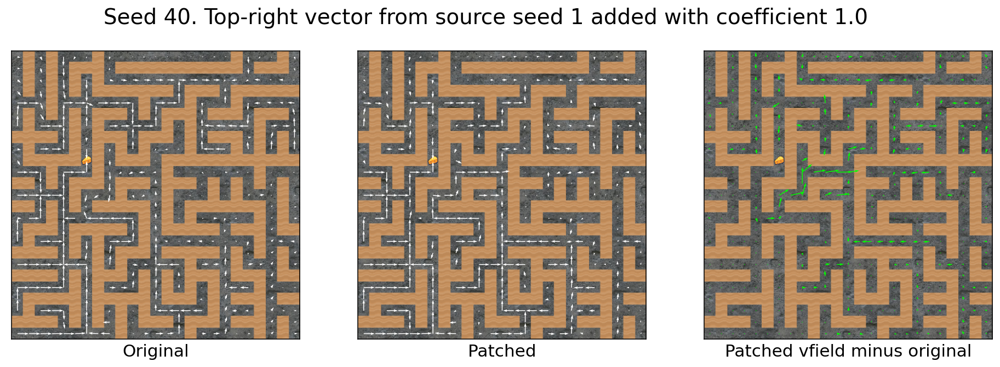

In [17]:
examine_tr_patch_transfer(coeff=1.0, source_seed=1, target_seed=40)

Compare this with the (lack of) effect of seed 0's top-right vector.
(This is probably because the target seed 40 is already quite large.)

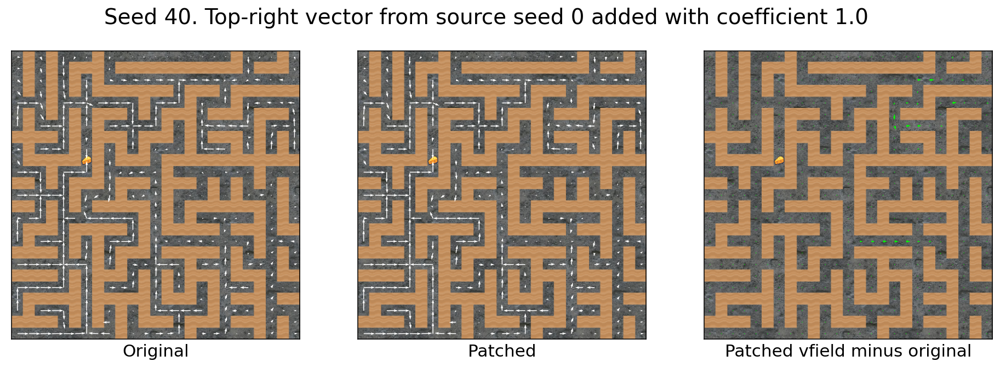

In [18]:
examine_tr_patch_transfer(coeff=1.0, source_seed=0, target_seed=40)

# Composition of top-right and cheese vectors
Subtracting the cheese vector often makes the agent (nearly) ignore
the cheese, and adding the top-right vector often attracts the agent to
the top-right corner. It turns out that you can mix and match these
effects by adding one or both vectors halfway through the forward pass. 

The patches compose! It's quite stunning.

In [19]:
@interact
def compose_patches(
    seed=IntSlider(min=0, max=100, step=1, value=0),
    cheese_vector=Checkbox(value=True),
    top_right_vector=Checkbox(value=True),
):
    patch_list = []
    if top_right_vector:
        tr_venv_pair = maze.get_top_right_venv_pair(seed=seed)
        tr_patch = patch_utils.patch_from_venv_pair(
            tr_venv_pair,
            layer_name=default_layer,
            hook=hook,
            coeff=1,
        )
        patch_list.append(tr_patch)

    if cheese_vector:
        cheese_diff_values = patch_utils.cheese_diff_values(
            seed=seed, layer_name=default_layer, hook=hook
        )
        cheese_patch = patch_utils.get_values_diff_patch(
            values=cheese_diff_values, coeff=-1, layer_name=default_layer
        )
        patch_list.append(cheese_patch)

    patch = patch_utils.compose_patches(*patch_list) if patch_list else {}

    target_venv = maze.create_venv(num=1, start_level=seed, num_levels=1)
    fig, axs, info = patch_utils.compare_patched_vfields(
        target_venv, patch, hook, render_padding=False, ax_size=AX_SIZE
    )

    # Title which patches we're using
    title = "Patches: "
    if top_right_vector:
        title += "Top-right vector, "
    if cheese_vector:
        title += "Cheese vector, "
    title = title[:-2]  # Remove trailing comma
    if patch_list == []:
        title = "No patches used"

    fig.suptitle(title, fontsize=20)

    plt.show(fig)

interactive(children=(IntSlider(value=0, description='seed'), Checkbox(value=True, description='cheese_vector'…

Let's see the configurations for seed 0:

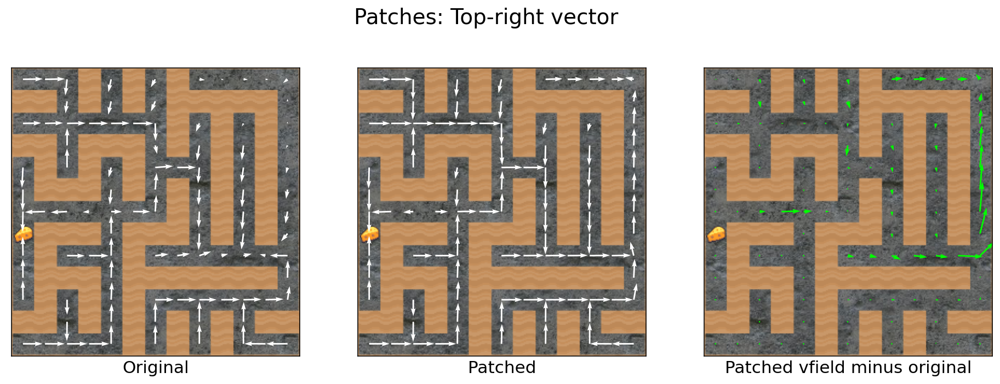

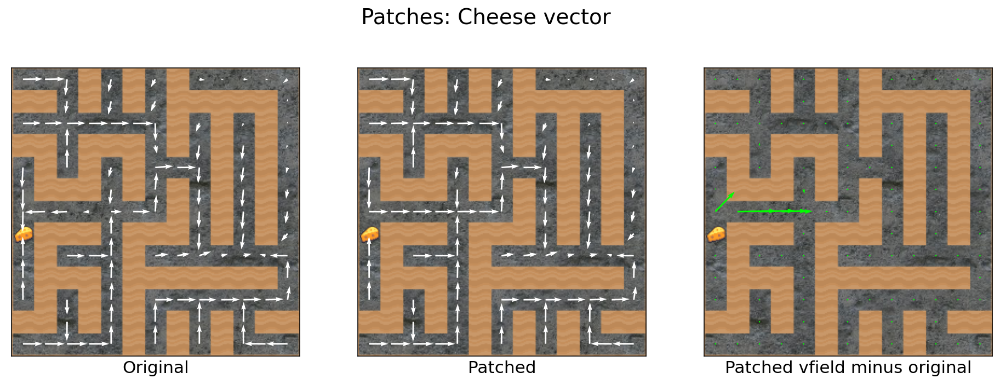

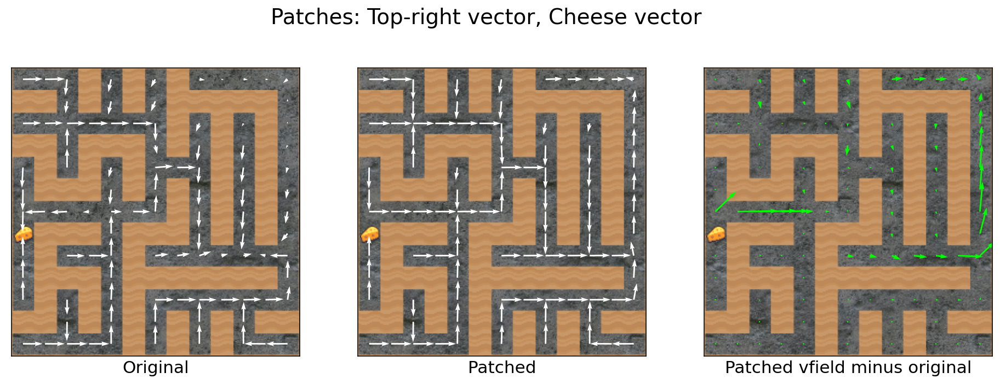

In [20]:
for use_cheese in [False, True]:
    for use_tr in [False, True]:
        if use_cheese or use_tr:
            compose_patches(
                seed=0, cheese_vector=use_cheese, top_right_vector=use_tr
            )

And for seed 25:

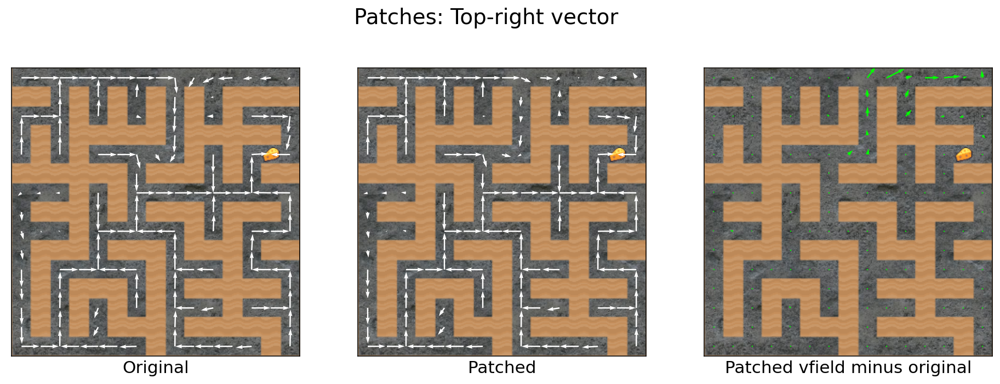

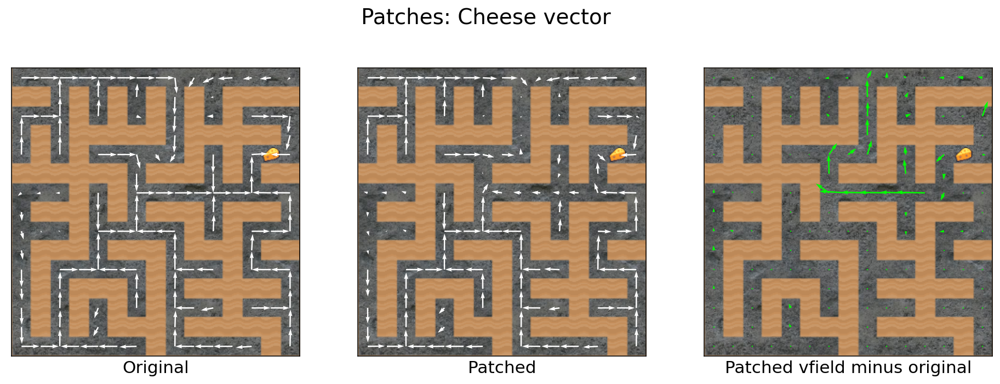

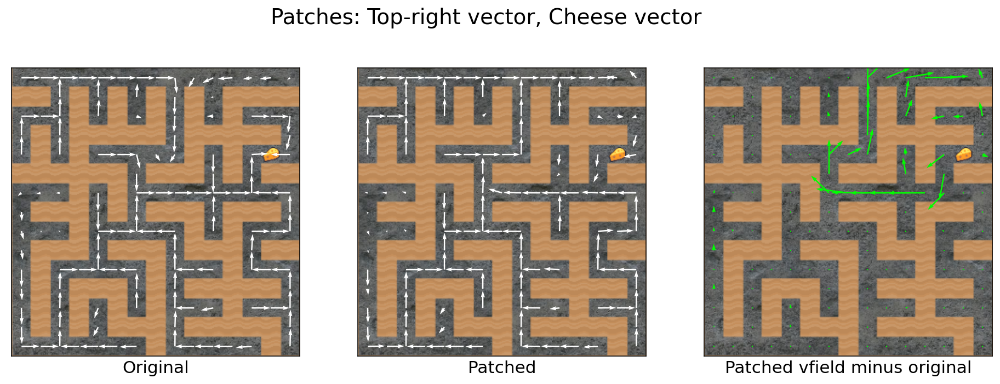

In [21]:
for use_cheese in [False, True]:
    for use_tr in [False, True]:
        if use_cheese or use_tr:
            compose_patches(
                seed=25, cheese_vector=use_cheese, top_right_vector=use_tr
            )

# Quantitatively measuring the impact of the top-right vector

In [2]:
from ANONYMIZED import vfield_stats as vfs
import plotly

vfields = [
    pickle.load(open(f, "rb"))
    for f in glob("experiments/statistics/data/vfields/top_right/seed-*.pkl")
]  # NOTE won't work in colab
vfields_by_level = defaultdict(list)
for vf in vfields:
    vfields_by_level[vf["seed"]].append(vf)


def get_vfields(seed: int, coeff: float):
    return next(vf for vf in vfields_by_level[seed] if vf["coeff"] == coeff)


def _coeffs_for(seed: int):
    return sorted(set(vf["coeff"] for vf in vfields_by_level[seed]))


seed_max = max(vf["seed"] for vf in vfields)
min_coeff, max_coeff = min(vf["coeff"] for vf in vfields), max(
    vf["coeff"] for vf in vfields
)

In [18]:
# Print average probabilities for both patched and original
orig, patched = vfs.get_probs_original_and_patched(vfields, coeff=3.0)
avg_orig, avg_patched = np.mean(orig[:, 1]), np.mean(patched[:, 1])
print(f"Average original probability of top-right: {avg_orig:.3f}")
print(f"Average modified probability of top-right: {avg_patched:.3f}")

Average original probability of top-right: 0.229
Average modified probability of top-right: 0.461


In [19]:
# Get the slider for coeffs_for
@interact(
    coeff=Dropdown(options=_coeffs_for(seed=0), value=3.0),
    fn=Dropdown(options=["scatter", "histogram", "boxplot"]),
)
def plotly_topright(coeff: float):
    for fn in [
        vfs.scatterplot_plotly,
        vfs.histogram_plotly,
        vfs.boxplot_plotly,
    ]:
        fig = fn(coeff=coeff, vfields=vfields, fig=vfs.plotly_fig_gen())
        fig.update_layout(
            title_text=fig.layout.title.text.replace("Cheese", "Top-right")
        )
        # Show the fig
        fig.show()

        # Save as pdf, making directory if necessary
        plotly.io.write_image(
            fig,
            f"figures/top_right_coeff-{coeff}-{fn.__name__}.pdf",
            width=800,
            height=350,
        )

interactive(children=(Dropdown(description='coeff', index=9, options=(-3.0, -2.0, -1.5, -1.0, -0.5, 0.5, 1.0, …